# Apply ML algorithms (We apply and try all the below methods)
* Linear Regression
* Lasso Regression
* Decision Tree Regressor
* KNN Regressor
* RandomForestRegressor
* Xgboost Regressor
* Huperparameter Tuning
* ANN- Artificial Neural Network

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

/Users/manojkashyap/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
df = pd.read_csv('Data/Real-Data/Real_Combine.csv')

In [3]:
df.head(5)

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833


In [4]:
# Check for Null values
df.isnull() #Too many to look..we can't find all

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...
726,False,False,False,False,False,False,False,False,False
727,False,False,False,False,False,False,False,False,False
728,False,False,False,False,False,False,False,False,False
729,False,False,False,False,False,False,False,False,False


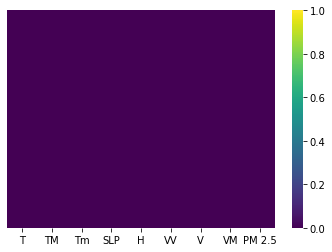

In [5]:
# Check for Null values using Seaboarn
sns.heatmap(df.isnull(), yticklabels= False, cbar= True, cmap= 'viridis')

* Thre are no Null values

In [6]:
#If we have Null, we'll drop anyways
df = df.dropna()

In [7]:
X = df.iloc[:, :-1] #Independent variables
y = df.iloc[:, -1] #Dependent variables

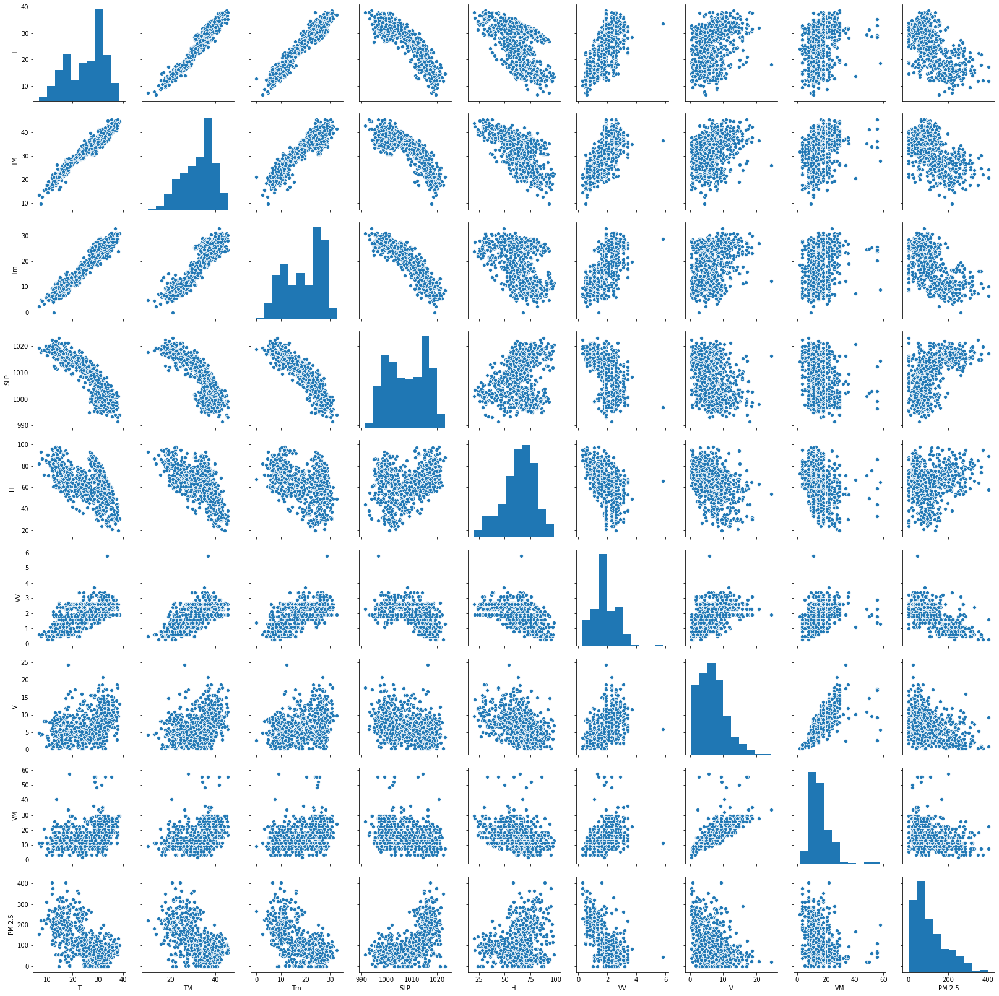

In [8]:
#Correlation
sns.pairplot(df)

* From above pairplots we can observe that none of the Predictors are in Linear relation with the Response variable(PM 2.5)

In [9]:
df.corr()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.967276,0.958892,-0.884383,-0.518870,0.622637,0.326067,0.287138,-0.628336
TM,0.967276,1.000000,0.896699,-0.829254,-0.599629,0.598479,0.320116,0.299508,-0.569381
Tm,0.958892,0.896699,1.000000,-0.909514,-0.315305,0.560299,0.312904,0.259431,-0.669059
SLP,-0.884383,-0.829254,-0.909514,1.000000,0.274196,-0.491842,-0.346130,-0.299830,0.615615
H,-0.518870,-0.599629,-0.315305,0.274196,1.000000,-0.475279,-0.399079,-0.370981,0.174658
VV,0.622637,0.598479,0.560299,-0.491842,-0.475279,1.000000,0.402884,0.347493,-0.628621
V,0.326067,0.320116,0.312904,-0.346130,-0.399079,0.402884,1.000000,0.760777,-0.354799
VM,0.287138,0.299508,0.259431,-0.299830,-0.370981,0.347493,0.760777,1.000000,-0.283695
PM 2.5,-0.628336,-0.569381,-0.669059,0.615615,0.174658,-0.628621,-0.354799,-0.283695,1.000000


* T, Tm and VV have(little negative Correlation) and SLP has (little positive Correlation)

### Correlation Matrix with Heatmap
* Correlation states how the features are related to each other or the target variable.

* Correlation can be positive (increase in one value of feature increases the value of the target variable) or negative (increase in one value of feature decreases the value of the target variable)

* Heatmap makes it easy to identify which features are most related to the target variable, we will plot heatmap of correlated features using the seaborn library.

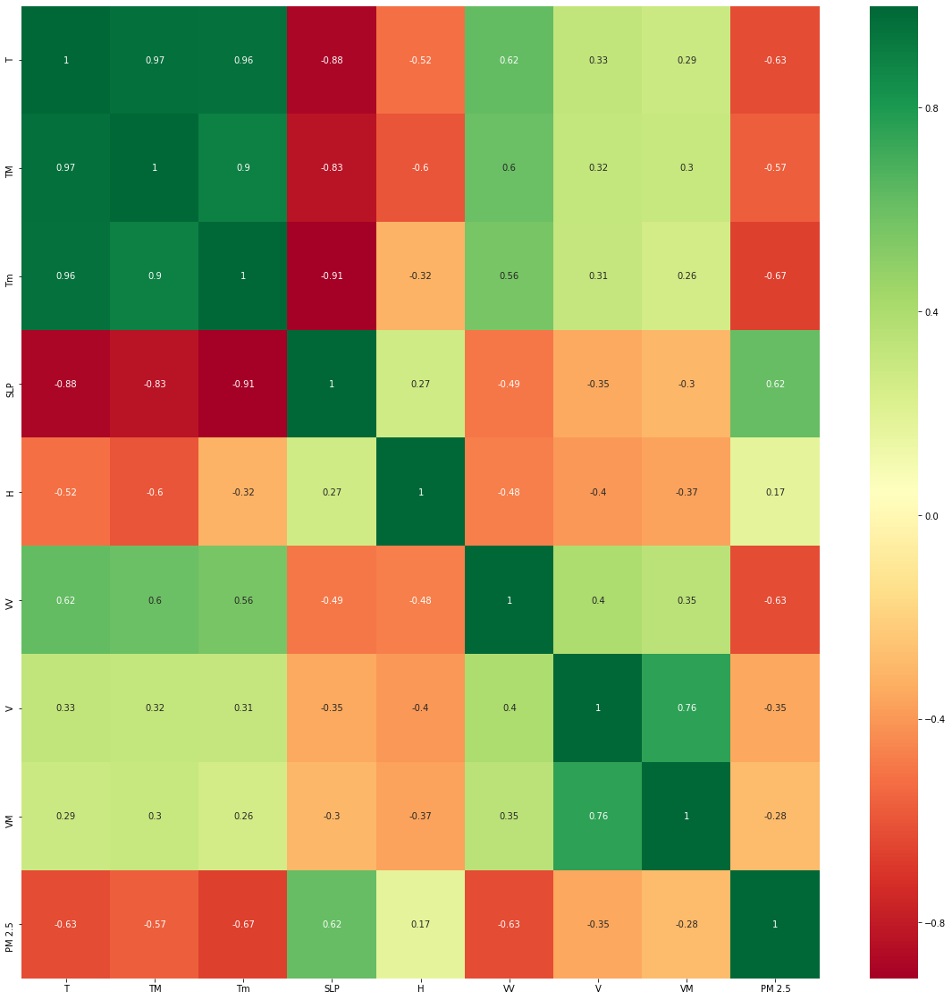

In [10]:
import seaborn as sns
#get correlations of each features in dataset
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#Plot heatmap
g = sns.heatmap(df[top_corr_features].corr(), annot = True, cmap= 'RdYlGn')

In [11]:
corrmat.index

Index(['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM', 'PM 2.5'], dtype='object')

### Feature Importance
* You can get the feature importance of each feature of your dataset by using the feature importance property of the model.

* Feature importance gives you a score for each feature of your data, the higher the score more important or relevant is the feature towards your output variable.

* Feature importance is an inbuilt class that comes with Tree Based Regressor, we will be using Extra Tree Regressor for extracting the top 10 features for the dataset.

In [17]:
from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt

In [18]:
model = ExtraTreesRegressor()
model.fit(X, y)

ExtraTreesRegressor()

In [19]:
X.head()

,T,TM,Tm,SLP,H,VV,V,VM
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2


In [20]:
print(model.feature_importances_)

[0.16591662 0.10233201 0.17326806 0.12369716 0.08391441 0.25795825
 0.05478789 0.0381256 ]


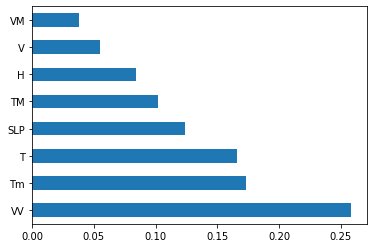

In [21]:
#plot graph of feature importances for better visualization
#Top 10..since we don't have 10 features..all are shown
feat_importances = pd.Series(model.feature_importances_, index= X.columns)
feat_importances.nlargest(10).plot(kind='barh') 
plt.show()

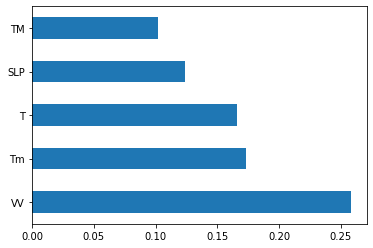

In [22]:
#plot graph of feature importances for better visualization
#Top 5
feat_importances = pd.Series(model.feature_importances_, index= X.columns)
feat_importances.nlargest(5).plot(kind='barh') 
plt.show()

* Now we know which are the Important Features(i.e Feature Selection) is done

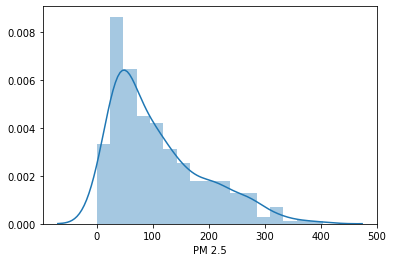

In [24]:
sns.distplot(y)

*We can see our Response variables is Right skewed

### Train Test split

In [12]:
from sklearn.model_selection import train_test_split

In [13]:
#Split 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.3, random_state= 0 )

## Decision Tree Regressor

In [14]:
from sklearn.tree import DecisionTreeRegressor

In [15]:
#Just trying DecisionTreeRegressor with Max depth...Overfitting
dtree = DecisionTreeRegressor(criterion='mse') #Just doing till single Leaf node...which gives 100% Accuracy

In [16]:
dtree.fit(X_train, y_train)

DecisionTreeRegressor()

In [30]:
#Train R-square....Overfitting
print("Coefficient of determination R^2 <-- on train set: {}".format(dtree.score(X_train, y_train)))

Coefficient of determination R^2 <-- on train set: 1.0


> Since we fitted our model to DecisionTreeRegressor with Max depth, without giving depth, it'll do till single Leaf node...which gives 100% Accuracy on TRAIN data

In [31]:
#Test R-square...Overfitting
print("Coefficient of determination R^2 <-- on test set: {}".format(dtree.score(X_test, y_test)))

Coefficient of determination R^2 <-- on test set: 0.3263726607054881


> We can see TEST data R^2 is Bad

### Cross Validating Overfit model ..5 folds

In [17]:
from sklearn.model_selection import cross_val_score
score = cross_val_score(dtree, X, y, cv=5)

In [18]:
score.mean()

0.04995146290084011

## Tree Visualization
Scikit learn actually has some built-in visualization capabilities for decision trees, you won't use this often and it requires you to install the pydot library, but here is an example of what it looks like and the code to execute this:

In [19]:
##conda install pydotplus
## conda install python-graphviz

from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus

In [50]:
features = list(df.columns[:-1])
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [ ]:
# To set path for graphviz
# If we get Error like: InvocationException: GraphViz's executables not found

#import os
#os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"

In [51]:
dot_data = StringIO()  
export_graphviz(dtree, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())


### Model Evaluation

In [20]:
prediction = dtree.predict(X_test)

In [21]:
prediction

array([200.875     , 217.25      , 188.5       , 130.33333333,
       250.875     ,  22.70833333,  23.875     , 252.625     ,
        32.95833333,  93.375     , 160.66666667,  57.        ,
         0.        , 302.45833333, 322.25      , 264.58333333,
        90.5       ,  41.5       , 332.70833333,  64.875     ,
       104.625     , 200.875     ,  18.        , 176.375     ,
       264.58333333, 105.33333333, 134.45833333, 103.41666667,
        77.        , 111.95833333,  93.375     ,   0.        ,
        52.45833333,  79.83333333, 200.64583333, 133.95833333,
       130.33333333, 284.16666667,  63.91666667, 149.625     ,
        50.33333333, 154.0375    ,  98.41666667, 108.20833333,
        99.91666667,  77.        , 152.55416667,  32.58333333,
        34.91666667,  77.        ,  46.91666667, 152.55416667,
        25.08333333, 261.66666667,  25.08333333,  79.        ,
       110.16666667,   4.83333333,  62.70833333, 185.95833333,
        42.29166667,  49.5       ,  52.45833333,  32.95

In [23]:
type(y_test)

pandas.core.series.Series

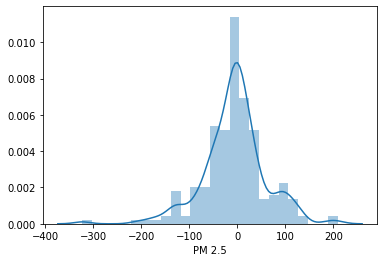

In [55]:
sns.distplot(y_test - prediction)

* Bell shape ..so need not to worry much

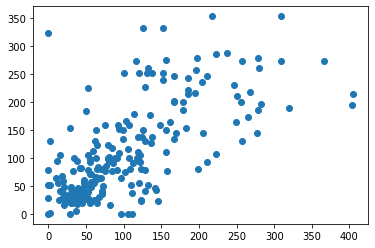

In [71]:
plt.scatter(y_test, prediction)

### Hyperparameter Tuning DEcision Tree Regressor

In [57]:
DecisionTreeRegressor()

DecisionTreeRegressor()

In [59]:
## Hyper Parameter Optimization

params={
 "splitter"    : ["best","random"] ,
 "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
 "min_samples_leaf" : [ 1,2,3,4,5 ],
"min_weight_fraction_leaf":[0.1,0.2,0.3,0.4],
 "max_features" : ["auto","log2","sqrt",None ],
    "max_leaf_nodes":[None,10,20,30,40,50,60,70]
    
}

In [60]:
## Hyperparameter optimization using GridSearchCV
from sklearn.model_selection import GridSearchCV

In [61]:
# 10 Fold CV
random_search = GridSearchCV(estimator= dtree, param_grid= params, scoring= 'neg_mean_squared_error',
                            n_jobs= -1, cv = 10, verbose= 3)

In [62]:
#Its just a Timer to calculate the timings of each fold run
def timer(start_time = None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

In [82]:
from datetime import datetime
# Here we go
start_time = timer(None) # timing starts from this point for "start_time" variable
random_search.fit(X_train,y_train)
timer(start_time) # timing ends here for "start_time" variable

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 1030 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done 2950 tasks      | elapsed:   20.8s
[Parallel(n_jobs=-1)]: Done 5638 tasks      | elapsed:   37.1s
[Parallel(n_jobs=-1)]: Done 9094 tasks      | elapsed:   56.7s
[Parallel(n_jobs=-1)]: Done 13318 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 18310 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 24070 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 30598 tasks      | elapsed:  2.8min
[Parallel(n_jobs=-1)]: Done 37894 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 45958 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 54790 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 64390 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 74758 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 85894 


 Time taken: 0 hours 7 minutes and 52.29 seconds.


In [83]:
#Checking which are the choosen PArametrs from Random Gridsearch
random_search.best_params_

{'max_depth': 3,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'min_samples_leaf': 5,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

* We can see it has taken depth of 3

In [85]:
random_search.best_score_

-2855.029017221067

> Compared to Linear, Ridge and LASSO, Dicission Tree Preformed well
>> It may not Great difference ...But here Decission Tree model is much more "Generalized-Model"

In [86]:
#Predicting based on Hyperparameter Tuning Decision Tree Regressor
prediction_1 = random_search.predict(X_test)

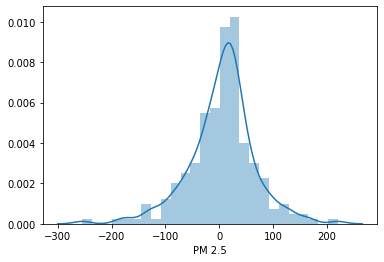

In [87]:
sns.distplot(prediction_1 - y_test)

## Regression Evaluation Metrics
Here are three common evaluation metrics for regression problems:

Mean Absolute Error (MAE) is the mean of the absolute value of the errors:

$$\frac 1n\sum_{i=1}^n|y_i-\hat{y}_i|$$
Mean Squared Error (MSE) is the mean of the squared errors:

$$\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2$$
Root Mean Squared Error (RMSE) is the square root of the mean of the squared errors:

$$\sqrt{\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2}$$
Comparing these metrics:

* MAE is the easiest to understand, because it's the average error.
* MSE is more popular than MAE, because MSE "punishes" larger errors, which tends to be useful in the real world.
* RMSE is even more popular than MSE, because RMSE is interpretable in the "y" units.

> All of these are loss functions, because we want to minimize them.

In [88]:
from sklearn import metrics

In [89]:
print('MAE: ', metrics.mean_absolute_error(y_test, prediction_1))
print('MSQ: ', metrics.mean_squared_error(y_test, prediction_1))
print('RMSE: ', np.sqrt(metrics.mean_squared_error(y_test, prediction_1)))

MAE:  45.25537784747056
MSQ:  3846.6002840625174
RMSE:  62.02096648765252


> Ridge & LASSO are giving Lesser RMSE compared to Decission Tree, But that doesn't mean that they are better than this
>> Because the Decission Tree we implemented using Hyperparameter tuning is much "Generalized model"

In [90]:
import pickle

In [91]:
# open a file, where you want to store the data
file = open('decision_regression_model.pkl.pkl', 'wb') #Opening in Write Bite mode
# dump information to that file
pickle.dump(random_search, file) #Dumping regressor to Opened file

* We can use this Pickle file while doing Deployment